In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import os
import cv2
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
import json
import anthropic

import warnings
warnings.filterwarnings("ignore")

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

# Check GPU availability
print("GPU Available:", tf.config.list_physical_devices('GPU'))
print("TensorFlow Version:", tf.__version__)

GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
TensorFlow Version: 2.9.1


In [5]:
DATA_PATH_TRAIN = 'Train'  
DATA_PATH_TEST = 'val'

class_names = sorted([d for d in os.listdir(DATA_PATH_TRAIN) 
                     if os.path.isdir(os.path.join(DATA_PATH_TRAIN, d))])

print(f"Number of classes: {len(class_names)}")
print(f"\nClass names (first 10): {class_names[:10]}")

class_counts_train = {}
all_image_paths_train = []
all_labels_train = []

for class_name in class_names:
    class_path = os.path.join(DATA_PATH_TRAIN, class_name)
    image_files = [f for f in os.listdir(class_path) 
                   if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    class_counts_train[class_name] = len(image_files)
    
    for img_file in image_files:
        all_image_paths_train.append(os.path.join(class_path, img_file))
        all_labels_train.append(class_name)

df_train = pd.DataFrame({
    'image_path': all_image_paths_train,
    'label': all_labels_train
})

print(f"Number of classes: {len(class_names)}")
print(f"\nClass names (first 10): {class_names[:10]}")

class_counts_test = {}
all_image_paths_test = []
all_labels_test = []

for class_name in class_names:
    class_path_test = os.path.join(DATA_PATH_TEST, class_name)
    image_files_test = [f for f in os.listdir(class_path_test) 
                   if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    class_counts_test[class_name] = len(image_files_test)

    for img_file in image_files_test:
        all_image_paths_test.append(os.path.join(class_path_test, img_file))
        all_labels_test.append(class_name)

df_test = pd.DataFrame({
    'image_path': all_image_paths_test,
    'label': all_labels_test
})

print(f"\nTotal images: {len(df_train)}")
print(f"\nDataset shape: {df_train.shape}")
print(f"\nFirst few rows:")
print(df_train.head())

print(f"\nImages per class statistics:")
print(f"Mean: {df_train['label'].value_counts().mean():.2f}")
print(f"Median: {df_train['label'].value_counts().median():.2f}")
print(f"Min: {df_train['label'].value_counts().min()}")
print(f"Max: {df_train['label'].value_counts().max()}")

Number of classes: 51

Class names (first 10): ['Amaranth', 'Apple', 'Banana', 'Beetroot', 'Bell pepper', 'Bitter Gourd', 'Blueberry', 'Bottle Gourd', 'Broccoli', 'Cabbage']
Number of classes: 51

Class names (first 10): ['Amaranth', 'Apple', 'Banana', 'Beetroot', 'Bell pepper', 'Bitter Gourd', 'Blueberry', 'Bottle Gourd', 'Broccoli', 'Cabbage']

Total images: 3990

Dataset shape: (3990, 2)

First few rows:
                       image_path     label
0   Train\Amaranth\Amaranth_1.jpg  Amaranth
1  Train\Amaranth\Amaranth_10.jpg  Amaranth
2  Train\Amaranth\Amaranth_11.jpg  Amaranth
3  Train\Amaranth\Amaranth_12.jpg  Amaranth
4  Train\Amaranth\Amaranth_13.jpg  Amaranth

Images per class statistics:
Mean: 78.24
Median: 83.00
Min: 28
Max: 100


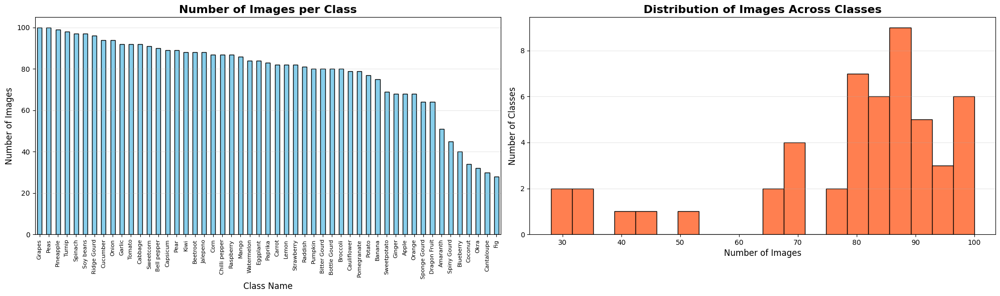


Class Imbalance Ratio (max/min): 3.57
Consider using class weights or oversampling techniques.


In [6]:
plt.figure(figsize=(20, 6))
class_distribution = df_train['label'].value_counts().sort_values(ascending=False)

plt.subplot(1, 2, 1)
class_distribution.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Number of Images per Class', fontsize=16, fontweight='bold')
plt.xlabel('Class Name', fontsize=12)
plt.ylabel('Number of Images', fontsize=12)
plt.xticks(rotation=90, fontsize=8)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()

plt.subplot(1, 2, 2)
plt.hist(class_distribution.values, bins=20, color='coral', edgecolor='black')
plt.title('Distribution of Images Across Classes', fontsize=16, fontweight='bold')
plt.xlabel('Number of Images', fontsize=12)
plt.ylabel('Number of Classes', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()

plt.show()

imbalance_ratio = class_distribution.max() / class_distribution.min()
print(f"\nClass Imbalance Ratio (max/min): {imbalance_ratio:.2f}")

if imbalance_ratio > 3:
    print("WARNING: Significant class imbalance detected!")
    print("Consider using class weights or oversampling techniques.")
else:
    print("Dataset is relatively balanced.")

Analyzing image properties (this may take a moment)...

📊 Image Properties Statistics:
             width       height  channels  aspect_ratio
count   100.000000   100.000000     100.0    100.000000
mean   1151.240000   965.070000       3.0      1.226975
std    1122.451098   871.773906       0.0      0.345420
min     220.000000   179.000000       3.0      0.651667
25%     600.000000   447.000000       3.0      1.000000
50%     950.000000   701.000000       3.0      1.266111
75%    1200.000000  1087.000000       3.0      1.499451
max    8256.000000  5504.000000       3.0      2.467470


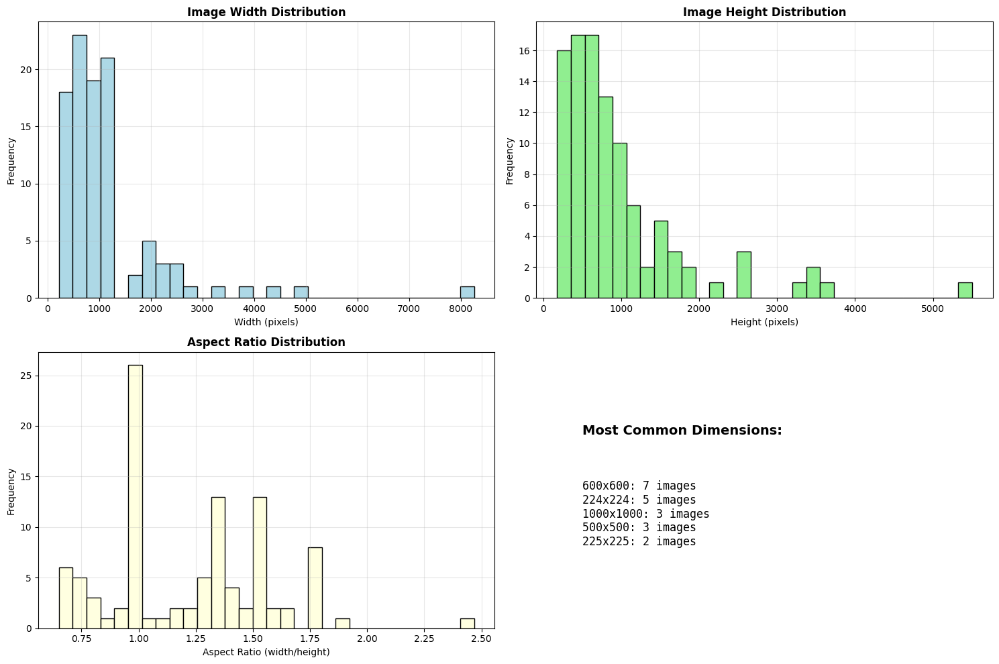

Recommended input size: 224x224 (MobileNetV2 standard)


In [7]:
sample_images = df_train.sample(min(100, len(df_train)), random_state=42)

image_properties = {
    'width': [],
    'height': [],
    'channels': [],
    'aspect_ratio': []
}

print("Analyzing image properties (this may take a moment)...")
for img_path in sample_images['image_path']:
    img = cv2.imread(img_path)
    if img is not None:
        h, w, c = img.shape
        image_properties['height'].append(h)
        image_properties['width'].append(w)
        image_properties['channels'].append(c)
        image_properties['aspect_ratio'].append(w/h)

img_props_df = pd.DataFrame(image_properties)

print("\n📊 Image Properties Statistics:")
print(img_props_df.describe())

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

axes[0, 0].hist(img_props_df['width'], bins=30, color='lightblue', edgecolor='black')
axes[0, 0].set_title('Image Width Distribution', fontweight='bold')
axes[0, 0].set_xlabel('Width (pixels)')
axes[0, 0].set_ylabel('Frequency')
axes[0, 0].grid(alpha=0.3)

axes[0, 1].hist(img_props_df['height'], bins=30, color='lightgreen', edgecolor='black')
axes[0, 1].set_title('Image Height Distribution', fontweight='bold')
axes[0, 1].set_xlabel('Height (pixels)')
axes[0, 1].set_ylabel('Frequency')
axes[0, 1].grid(alpha=0.3)

axes[1, 0].hist(img_props_df['aspect_ratio'], bins=30, color='lightyellow', edgecolor='black')
axes[1, 0].set_title('Aspect Ratio Distribution', fontweight='bold')
axes[1, 0].set_xlabel('Aspect Ratio (width/height)')
axes[1, 0].set_ylabel('Frequency')
axes[1, 0].grid(alpha=0.3)

common_dims = img_props_df.groupby(['width', 'height']).size().sort_values(ascending=False).head(5)
axes[1, 1].axis('off')
axes[1, 1].text(0.1, 0.7, 'Most Common Dimensions:', fontsize=14, fontweight='bold')
dims_text = '\n'.join([f"{w}x{h}: {count} images" 
                       for (w, h), count in common_dims.items()])
axes[1, 1].text(0.1, 0.3, dims_text, fontsize=12, family='monospace')

plt.tight_layout()
plt.show()

print(f"Recommended input size: 224x224 (MobileNetV2 standard)")

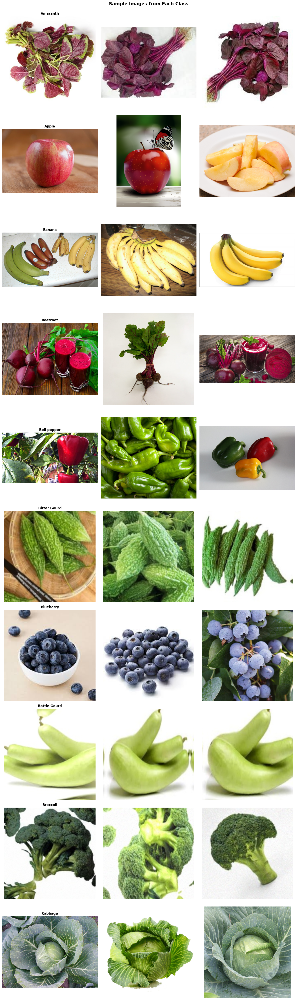

In [8]:
n_samples = 3  
n_classes_to_show = 10  

fig, axes = plt.subplots(n_classes_to_show, n_samples, figsize=(15, 5*n_classes_to_show))

for i, class_name in enumerate(class_names[:n_classes_to_show]):
    class_images = df_train[df_train['label'] == class_name].sample(n=min(n_samples, len(df_train[df_train['label'] == class_name])))
    
    for j, (_, row) in enumerate(class_images.iterrows()):
        img = cv2.imread(row['image_path'])
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        axes[i, j].imshow(img_rgb)
        axes[i, j].axis('off')
        if j == 0:
            axes[i, j].set_title(f'{class_name}', fontsize=12, fontweight='bold')

plt.suptitle('Sample Images from Each Class', fontsize=16, fontweight='bold', y=1.0)
plt.tight_layout()
plt.show()

In [13]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
df_train['label_encoded'] = le.fit_transform(df_train['label'])

label_mapping_train = dict(zip(le.classes_, le.transform(le.classes_)))
print("Label Mapping (class -> number):")
for class_name, idx in sorted(label_mapping_train.items(), key=lambda x: x[1])[:10]:
    print(f"  {idx}: {class_name}")

X = df_train['image_path'].values
y = df_train['label_encoded'].values

X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

df_test['label_encoded'] = le.transform(df_test['label'])

label_mapping_test = dict(zip(le.classes_, le.transform(le.classes_)))
print("Label Mapping (class -> number):")
for class_name, idx in sorted(label_mapping_test.items(), key=lambda x: x[1])[:10]:
    print(f"  {idx}: {class_name}")

X_test = df_test['image_path'].values
y_test = df_test['label_encoded'].values

print(f"\n Data Split Summary:")
print(f"Training set:   {len(X_train)} images ({len(X_train)/len(X)*100:.1f}%)")
print(f"Validation set: {len(X_val)} images ({len(X_val)/len(X)*100:.1f}%)")
print(f"Test set:       {len(X_test)} images ({len(X_test)/len(X)*100:.1f}%)")

print(f"\nClass distribution check:")
print(f"Train classes: {len(np.unique(y_train))}")
print(f"Val classes:   {len(np.unique(y_val))}")
print(f"Test classes:  {len(np.unique(y_test))}")

Label Mapping (class -> number):
  0: Amaranth
  1: Apple
  2: Banana
  3: Beetroot
  4: Bell pepper
  5: Bitter Gourd
  6: Blueberry
  7: Bottle Gourd
  8: Broccoli
  9: Cabbage
Label Mapping (class -> number):
  0: Amaranth
  1: Apple
  2: Banana
  3: Beetroot
  4: Bell pepper
  5: Bitter Gourd
  6: Blueberry
  7: Bottle Gourd
  8: Broccoli
  9: Cabbage

 Data Split Summary:
Training set:   3192 images (80.0%)
Validation set: 798 images (20.0%)
Test set:       511 images (12.8%)

Class distribution check:
Train classes: 51
Val classes:   51
Test classes:  51


Found 3192 validated image filenames belonging to 51 classes.
Found 798 validated image filenames belonging to 51 classes.
Found 511 validated image filenames belonging to 51 classes.
Data generators created successfully!

Batches per epoch:
  Training:   100
  Validation: 25
  Test:       16

📸 Visualizing data augmentation effects...


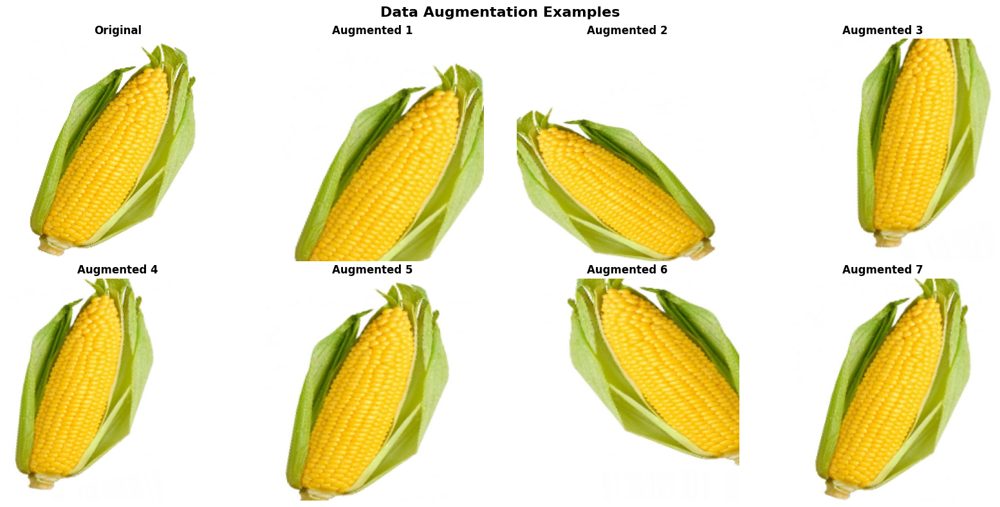

In [12]:
IMG_SIZE = 224  # MobileNetV2 input size
BATCH_SIZE = 32


train_datagen = ImageDataGenerator(
    rescale=1./255,  
    rotation_range=20,  
    width_shift_range=0.2, 
    height_shift_range=0.2,  
    shear_range=0.2,  
    zoom_range=0.2, 
    horizontal_flip=True,  
    fill_mode='nearest'  
)

val_test_datagen = ImageDataGenerator(rescale=1./255)

def create_generator(datagen, image_paths, labels, batch_size, shuffle=True):
    """Custom generator that loads images from paths"""
    df_temp = pd.DataFrame({
    'filename': image_paths,
    'class': le.inverse_transform(labels)
    })
    
    return datagen.flow_from_dataframe(
        df_temp,
        x_col='filename',
        y_col='class',
        target_size=(IMG_SIZE, IMG_SIZE),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=shuffle
    )

train_generator = create_generator(train_datagen, X_train, y_train, BATCH_SIZE, shuffle=True)
val_generator = create_generator(val_test_datagen, X_val, y_val, BATCH_SIZE, shuffle=False)
test_generator = create_generator(val_test_datagen, X_test, y_test, BATCH_SIZE, shuffle=False)

print("Data generators created successfully!")
print(f"\nBatches per epoch:")
print(f"  Training:   {len(train_generator)}")
print(f"  Validation: {len(val_generator)}")
print(f"  Test:       {len(test_generator)}")

print("\n📸 Visualizing data augmentation effects...")
sample_img_path = X_train[0]
sample_img = cv2.imread(sample_img_path)
sample_img_rgb = cv2.cvtColor(sample_img, cv2.COLOR_BGR2RGB)
sample_img_resized = cv2.resize(sample_img_rgb, (IMG_SIZE, IMG_SIZE))
sample_img_normalized = sample_img_resized / 255.0

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes[0, 0].imshow(sample_img_resized)
axes[0, 0].set_title('Original', fontweight='bold')
axes[0, 0].axis('off')

for i in range(1, 8):
    augmented = train_datagen.random_transform(sample_img_normalized)
    ax = axes[i // 4, i % 4]
    ax.imshow(augmented)
    ax.set_title(f'Augmented {i}', fontweight='bold')
    ax.axis('off')

plt.suptitle('Data Augmentation Examples', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

In [14]:
from sklearn.utils.class_weight import compute_class_weight

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)

class_weight_dict = dict(enumerate(class_weights))

print("Class Weights Calculated:")
print(f"Weights range: {min(class_weights):.3f} to {max(class_weights):.3f}")
print(f"\nSample weights (first 10 classes):")
for i in range(min(10, len(class_weight_dict))):
    class_name = le.inverse_transform([i])[0]
    print(f"  {i} ({class_name}): {class_weight_dict[i]:.3f}")

Class Weights Calculated:
Weights range: 0.782 to 2.845

Sample weights (first 10 classes):
  0 (Amaranth): 1.527
  1 (Apple): 1.159
  2 (Banana): 1.043
  3 (Beetroot): 0.894
  4 (Bell pepper): 0.869
  5 (Bitter Gourd): 0.978
  6 (Blueberry): 1.956
  7 (Bottle Gourd): 0.978
  8 (Broccoli): 0.978
  9 (Cabbage): 0.846


In [15]:
NUM_CLASSES = len(class_names)

base_model = MobileNetV2(
    input_shape=(IMG_SIZE, IMG_SIZE, 3),
    include_top=False, 
    weights='imagenet' 
)

base_model.trainable = False

inputs = base_model.input
x = base_model.output
x = GlobalAveragePooling2D()(x)  
x = Dropout(0.3)(x)  
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)
outputs = Dense(NUM_CLASSES, activation='softmax')(x) 

model = Model(inputs=inputs, outputs=outputs)

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy', tf.keras.metrics.TopKCategoricalAccuracy(k=3, name='top_3_accuracy')]
)

print("Model built successfully!")
print(f"\n Model Summary:")
model.summary()

print(f"\n Model Parameters:")
print(f"Total params: {model.count_params():,}")
trainable_params = sum([tf.size(w).numpy() for w in model.trainable_weights])
print(f"Trainable params: {trainable_params:,}")
print(f"Non-trainable params: {model.count_params() - trainable_params:,}")

Model built successfully!

 Model Summary:
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                  

In [16]:
callbacks = [
    EarlyStopping(
        monitor='val_loss',
        patience=5, 
        restore_best_weights=True,
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,  
        patience=3,
        min_lr=1e-7,
        verbose=1
    ),
    ModelCheckpoint(
        'best_model.h5',
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    )
]

print("Starting training...")
print(f"Training for up to 30 epochs (early stopping enabled)")
print(f"Using class weights to handle imbalance\n")

EPOCHS = 30

history = model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=val_generator,
    class_weight=class_weight_dict,
    callbacks=callbacks,
    verbose=1
)

print("\nTraining completed!")
print("Best model saved as 'best_model.h5'")

Starting training...
Training for up to 30 epochs (early stopping enabled)
Using class weights to handle imbalance

Epoch 1/30
100/100 [==============================] - ETA: 0s - loss: 2.5779 - accuracy: 0.3609 - top_3_accuracy: 0.5457
Epoch 1: val_accuracy improved from -inf to 0.72807, saving model to best_model.h5
100/100 [==============================] - 99s 959ms/step - loss: 2.5779 - accuracy: 0.3609 - top_3_accuracy: 0.5457 - val_loss: 1.0004 - val_accuracy: 0.7281 - val_top_3_accuracy: 0.9073 - lr: 0.0010
Epoch 2/30
100/100 [==============================] - ETA: 0s - loss: 1.1384 - accuracy: 0.6642 - top_3_accuracy: 0.8618
Epoch 2: val_accuracy improved from 0.72807 to 0.80326, saving model to best_model.h5
100/100 [==============================] - 75s 752ms/step - loss: 1.1384 - accuracy: 0.6642 - top_3_accuracy: 0.8618 - val_loss: 0.6760 - val_accuracy: 0.8033 - val_top_3_accuracy: 0.9486 - lr: 0.0010
Epoch 3/30
100/100 [==============================] - ETA: 0s - loss: 0

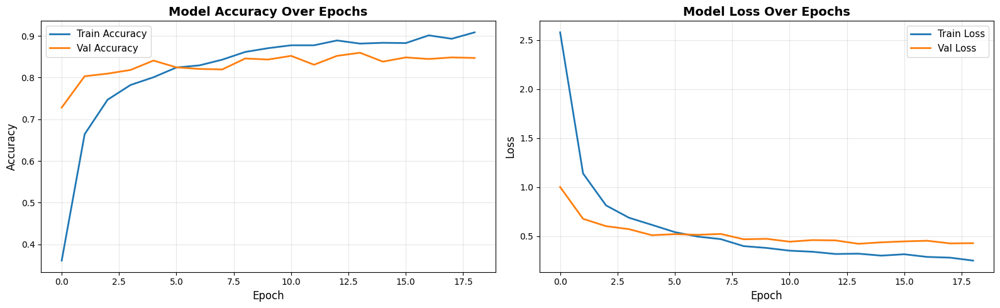


 Training Results:
Final Training Accuracy:   0.9085
Final Validation Accuracy: 0.8471
Final Training Loss:       0.2497
Final Validation Loss:     0.4274

🔍 Overfitting Check:
Train-Val Accuracy Gap: 0.0614
Model is generalizing well


In [17]:
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

axes[0].plot(history.history['accuracy'], label='Train Accuracy', linewidth=2)
axes[0].plot(history.history['val_accuracy'], label='Val Accuracy', linewidth=2)
axes[0].set_title('Model Accuracy Over Epochs', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Accuracy', fontsize=12)
axes[0].legend(fontsize=11)
axes[0].grid(alpha=0.3)

axes[1].plot(history.history['loss'], label='Train Loss', linewidth=2)
axes[1].plot(history.history['val_loss'], label='Val Loss', linewidth=2)
axes[1].set_title('Model Loss Over Epochs', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Loss', fontsize=12)
axes[1].legend(fontsize=11)
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n Training Results:")
print(f"Final Training Accuracy:   {history.history['accuracy'][-1]:.4f}")
print(f"Final Validation Accuracy: {history.history['val_accuracy'][-1]:.4f}")
print(f"Final Training Loss:       {history.history['loss'][-1]:.4f}")
print(f"Final Validation Loss:     {history.history['val_loss'][-1]:.4f}")

train_acc = history.history['accuracy'][-1]
val_acc = history.history['val_accuracy'][-1]
gap = train_acc - val_acc

print(f"\n🔍 Overfitting Check:")
print(f"Train-Val Accuracy Gap: {gap:.4f}")
if gap > 0.1:
    print("Model might be overfitting (gap > 10%)")
else:
    print("Model is generalizing well")

In [18]:
model = tf.keras.models.load_model('best_model.h5')

print("Evaluating on test set...\n")

# Evaluate
test_loss, test_acc, test_top3_acc = model.evaluate(test_generator, verbose=1)

print(f"\n Test Set Results:")
print(f"Test Accuracy:     {test_acc:.4f} ({test_acc*100:.2f}%)")
print(f"Top-3 Accuracy:    {test_top3_acc:.4f} ({test_top3_acc*100:.2f}%)")
print(f"Test Loss:         {test_loss:.4f}")

# Get predictions
test_generator.reset()
y_pred_probs = model.predict(test_generator, verbose=1)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = test_generator.classes

# Classification report
print("\n Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_names, digits=3))

Evaluating on test set...

16/16 [==============================] - 13s 801ms/step - loss: 0.2231 - accuracy: 0.9315 - top_3_accuracy: 0.9863

 Test Set Results:
Test Accuracy:     0.9315 (93.15%)
Top-3 Accuracy:    0.9863 (98.63%)
Test Loss:         0.2231
16/16 [==============================] - 9s 530ms/step

 Classification Report:
               precision    recall  f1-score   support

     Amaranth      1.000     1.000     1.000        10
        Apple      0.727     0.800     0.762        10
       Banana      0.875     0.778     0.824         9
     Beetroot      1.000     1.000     1.000        10
  Bell pepper      0.636     0.778     0.700         9
 Bitter Gourd      1.000     1.000     1.000        11
    Blueberry      1.000     1.000     1.000         8
 Bottle Gourd      1.000     0.737     0.848        19
     Broccoli      1.000     0.941     0.970        17
      Cabbage      0.909     1.000     0.952        10
   Cantaloupe      1.000     1.000     1.000         6
 

In [19]:
import pickle

# Keras H5 format
model.save('food_ingredient_classifier.h5')

# SavedModel format (better for deployment)
model.save('food_ingredient_model')

with open('label_encoder.pkl', 'wb') as f:
    pickle.dump(le, f)
print("✓ Saved: label_encoder.pkl")

with open('class_names.json', 'w') as f:
    json.dump(class_names, f, indent=2)
print("✓ Saved: class_names.json")

model_config = {
    'img_size': IMG_SIZE,
    'num_classes': NUM_CLASSES,
    'class_names': class_names,
    'test_accuracy': float(test_acc),
    'test_top3_accuracy': float(test_top3_acc),
    'model_architecture': 'MobileNetV2',
    'input_shape': [IMG_SIZE, IMG_SIZE, 3],
    'preprocessing': 'rescale_1_255'
}

with open('model_config.json', 'w') as f:
    json.dump(model_config, f, indent=2)
print("✓ Saved: model_config.json")

INFO:tensorflow:Assets written to: food_ingredient_model\assets


INFO:tensorflow:Assets written to: food_ingredient_model\assets


✓ Saved: label_encoder.pkl
✓ Saved: class_names.json
✓ Saved: model_config.json


In [21]:
from groq import Groq
from dotenv import load_dotenv
import os

load_dotenv()

API_KEY = os.getenv("API_KEY")

client = Groq(api_key = API_KEY)

def generate_recipe_prompt(predicted_ingredients, confidences):
    ingredient_list = []
    for ing, conf in zip(predicted_ingredients, confidences):
        ingredient_list.append(f"- {ing} (confidence: {conf*100:.1f}%)")
    
    ingredients_text = "\n".join(ingredient_list)
    
    prompt = f"""Based on the following detected food ingredients, please suggest a delicious recipe:

Detected Ingredients:
{ingredients_text}

Please provide:
1. Recipe name
2. List of additional ingredients needed (if any)
3. Step-by-step cooking instructions
4. Estimated preparation and cooking time
5. Serving suggestions

Make the recipe practical and suitable for home cooking."""
    
    return prompt

def get_recipe_from_llm(prompt):
    if prompt is None:
        print("No Prompt provided!!")
        return 
    
    try:
        chat_completion = client.chat.completions.create(
            model="llama-3.3-70b-versatile", 
            messages=[
                {"role": "user", "content": prompt}
            ],
            temperature=0.7, 
            max_tokens=500, 
        )

        resep = chat_completion.choices[0].message.content
        
        print("\n=== 🍽️ REKOMENDASI RESEP DARI GROQ ===")
        print(resep)
    
    except Exception as e:
        print(f"❌ TERJADI ERROR: {str(e)}")

example_ingredients = ['tomato', 'onion', 'garlic', 'chicken', 'olive oil']
example_confidences = [0.95, 0.89, 0.87, 0.92, 0.78]

print("📝 Example Recipe Prompt Generation:")
print("=" * 70)
example_prompt = generate_recipe_prompt(example_ingredients, example_confidences)
print(example_prompt)
print("=" * 70)

get_recipe_from_llm(example_prompt)

📝 Example Recipe Prompt Generation:
Based on the following detected food ingredients, please suggest a delicious recipe:

Detected Ingredients:
- tomato (confidence: 95.0%)
- onion (confidence: 89.0%)
- garlic (confidence: 87.0%)
- chicken (confidence: 92.0%)
- olive oil (confidence: 78.0%)

Please provide:
1. Recipe name
2. List of additional ingredients needed (if any)
3. Step-by-step cooking instructions
4. Estimated preparation and cooking time
5. Serving suggestions

Make the recipe practical and suitable for home cooking.

=== 🍽️ REKOMENDASI RESEP DARI GROQ ===
**Recipe Name:** Chicken and Tomato Stir-Fry

**Detected Ingredients and Their Roles:**
The detected ingredients play a crucial role in this recipe. The tomato (95.0% confidence) provides a burst of juicy sweetness, while the onion (89.0% confidence) adds a pungent flavor. The garlic (87.0% confidence) contributes to the aroma and depth of the dish. The chicken (92.0% confidence) is the protein source, and the olive oil (7

Testing Complete Pipeline

val\Raspberry\Raspberry_5.jpg

TEST SAMPLE 1
['Raspberry', 'Pomegranate', 'Dragon Fruit', 'Grapes', 'Pineapple']


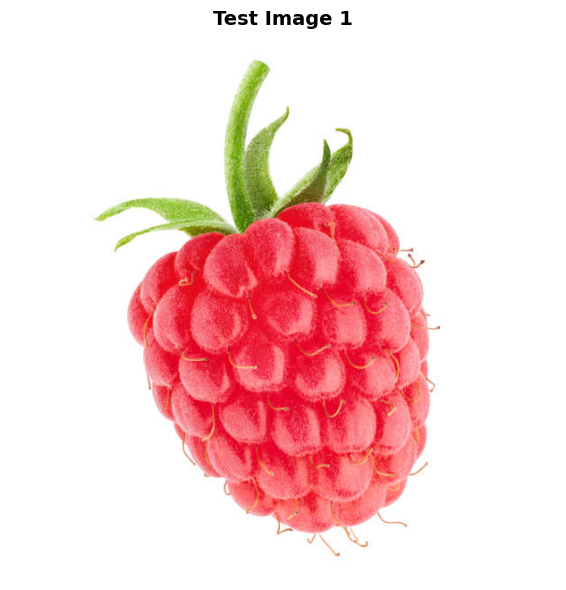


Detected Ingredients (Top 5):
  1. Raspberry                 98.29% ███████████████████
  2. Pomegranate                0.60% 
  3. Dragon Fruit               0.55% 
  4. Grapes                     0.29% 
  5. Pineapple                  0.09% 

📝 Generated Recipe Prompt:
--------------------------------------------------------------------------------
Based on the following detected food ingredients, please suggest a delicious recipe:

Detected Ingredients:
- Raspberry (confidence: 98.3%)
- Pomegranate (confidence: 0.6%)
- Dragon Fruit (confidence: 0.6%)
- Grapes (confidence: 0.3%)
- Pineapple (confidence: 0.1%)

Please provide:
1. Recipe name
2. List of additional ingredients needed (if any)
3. Step-by-step cooking instructions
4. Estimated preparation and cooking time
5. Serving suggestions

Make the recipe practical and suitable for home cooking.
--------------------------------------------------------------------------------

 Asking Llama 3 (Groq) for Recipe...

=== 🍽️ REKOMENDASI

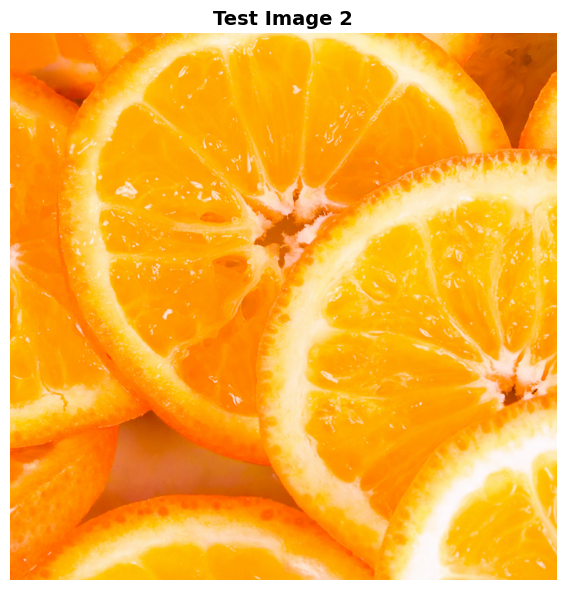


Detected Ingredients (Top 5):
  1. Orange                    99.31% ███████████████████
  2. Lemon                      0.69% 
  3. Watermelon                 0.00% 
  4. Cabbage                    0.00% 
  5. Cantaloupe                 0.00% 

📝 Generated Recipe Prompt:
--------------------------------------------------------------------------------
Based on the following detected food ingredients, please suggest a delicious recipe:

Detected Ingredients:
- Orange (confidence: 99.3%)
- Lemon (confidence: 0.7%)
- Watermelon (confidence: 0.0%)
- Cabbage (confidence: 0.0%)
- Cantaloupe (confidence: 0.0%)

Please provide:
1. Recipe name
2. List of additional ingredients needed (if any)
3. Step-by-step cooking instructions
4. Estimated preparation and cooking time
5. Serving suggestions

Make the recipe practical and suitable for home cooking.
--------------------------------------------------------------------------------

 Asking Llama 3 (Groq) for Recipe...

=== 🍽️ REKOMENDASI RESEP DA

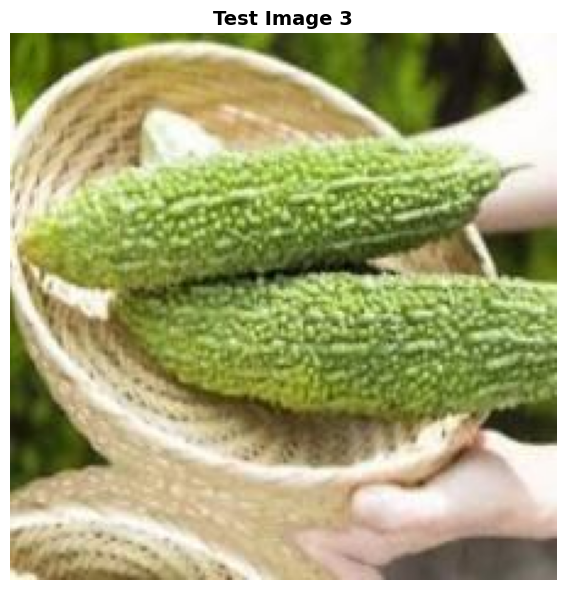


Detected Ingredients (Top 5):
  1. Bitter Gourd              99.86% ███████████████████
  2. Ridge Gourd                0.14% 
  3. Cucumber                   0.00% 
  4. Cantaloupe                 0.00% 
  5. Sweetcorn                  0.00% 

📝 Generated Recipe Prompt:
--------------------------------------------------------------------------------
Based on the following detected food ingredients, please suggest a delicious recipe:

Detected Ingredients:
- Bitter Gourd (confidence: 99.9%)
- Ridge Gourd (confidence: 0.1%)
- Cucumber (confidence: 0.0%)
- Cantaloupe (confidence: 0.0%)
- Sweetcorn (confidence: 0.0%)

Please provide:
1. Recipe name
2. List of additional ingredients needed (if any)
3. Step-by-step cooking instructions
4. Estimated preparation and cooking time
5. Serving suggestions

Make the recipe practical and suitable for home cooking.
--------------------------------------------------------------------------------

 Asking Llama 3 (Groq) for Recipe...

=== 🍽️ REKOMEND

In [22]:
def complete_pipeline(image_path, model, label_encoder, img_size=224, top_k=5):
    """
    Complete pipeline: Image → Ingredient Prediction → Recipe Prompt
    """
    # Step 1: Load and preprocess image
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img_rgb, (img_size, img_size))
    img_normalized = img_resized / 255.0
    img_batch = np.expand_dims(img_normalized, axis=0)
    
    # Step 2: Make prediction
    predictions = model.predict(img_batch, verbose=0)
    top_k_idx = np.argsort(predictions[0])[-top_k:][::-1]

    
    # Step 3: Get ingredient names and confidences
    ingredients = []
    confidences = []
    for idx in top_k_idx:
        ingredients.append(label_encoder.inverse_transform([idx])[0])
        confidences.append(predictions[0][idx])
    
    # Step 4: Generate recipe prompt
    recipe_prompt = generate_recipe_prompt(ingredients, confidences)
    
    return {
        'image': img_rgb,
        'ingredients': ingredients,
        'confidences': confidences,
        'recipe_prompt': recipe_prompt
    }

# Test with multiple images
print("Testing Complete Pipeline\n")
print("=" * 80)

test_samples = X_test[np.random.choice(len(X_test), 3, replace=False)]

for i, test_img_path in enumerate(test_samples, 1):
    print(test_img_path)
    print(f"\n{'='*80}")
    print(f"TEST SAMPLE {i}")
    print(f"{'='*80}")
    
    result = complete_pipeline(test_img_path, model, le)
    print(result['ingredients'])
    
    plt.figure(figsize=(8, 6))
    plt.imshow(result['image'])
    plt.title(f"Test Image {i}", fontweight='bold', fontsize=14)
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    print(f"\nDetected Ingredients (Top 5):")
    for j, (ing, conf) in enumerate(zip(result['ingredients'], result['confidences']), 1):
        bar = '█' * int(conf * 20)
        print(f"  {j}. {ing:<25} {conf*100:>5.2f}% {bar}")

    print(f"\n📝 Generated Recipe Prompt:")
    print("-" * 80)
    print(result['recipe_prompt'])
    print("-" * 80)

    print(f"\n Asking Llama 3 (Groq) for Recipe...")
    get_recipe_from_llm(result['recipe_prompt'])

    print("\n" + "="*80)